<a href="https://colab.research.google.com/github/sjkim-audio/Bass-separator/blob/main/notebooks/transcription/02_tracking_separated_bass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
print("📦 라이브러리 재설치 중...")
!pip install "torchaudio>=2.0.0" soundfile
!pip install torchcodec
!pip install demucs

In [3]:
import os
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from IPython.display import Audio, display
from google.colab import drive

In [ ]:
import sys

# ==========================================
# [설정] 프로젝트 및 데이터 경로
# ==========================================
REPO_URL = "https://github.com/sjkim-audio/Bass-separator.git"
PROJECT_NAME = "Bass-separator"

# ==========================================
# 1. Git 프로젝트 설정 (Clone & Path)
# ==========================================
# 1-1. 깃허브에서 프로젝트 다운로드
if not os.path.exists(PROJECT_NAME):
    print(f"Cloning repository... ({PROJECT_NAME})")
    !git clone {REPO_URL}
else:
    print("Repository already exists.")

# 1-2. 작업 경로 변경 (Repo 폴더 안으로 이동)
if PROJECT_NAME not in os.getcwd():
    os.chdir(PROJECT_NAME)
    print(f"Changed working directory: {os.getcwd()}")

# 1-3. 시스템 경로 추가 (src 폴더 인식을 위함)
if os.getcwd() not in sys.path:
    sys.path.append(os.getcwd())

# 구글 드라이브 내 데이터셋 원본 위치
MY_DRIVE_PATH = "/content/drive/MyDrive/Bass_separator/dataset"
# src 의 데이터셋 로드 함수 실행
from src.utils import load_data_from_drive
load_data_from_drive(MY_DRIVE_PATH)


In [ ]:
import subprocess

# [사용자 수정 영역] 분석할 오디오 파일의 경로를 입력

target_file_path = "/content/drive/MyDrive/Bass_separator/dataset/기타 베이스 분리 예제 2.wav"

# ==========================================
# 3. Demucs로 베이스 트랙 분리
# ==========================================
print("🚀 Demucs 분리 시작...")

# 파일명 추출 (확장자 제외)
filename = os.path.splitext(os.path.basename(target_file_path))[0]

# Demucs 실행 (htdemucs 모델 사용)
# -n htdemucs: 고성능 모델
# --two-stems=bass: '베이스'와 '나머지'로만 분리 (속도 절약)
cmd = f'demucs -n htdemucs --two-stems=bass "{target_file_path}"'
process = subprocess.run(cmd, shell=True, capture_output=True, text=True, check=False)

# 분리된 베이스 파일 경로 자동 탐색
# Demucs 기본 출력 경로: separated/htdemucs/파일명/bass.wav
bass_stem_path = os.path.join('separated', 'htdemucs', filename, 'bass.wav')

if not os.path.exists(bass_stem_path):
    print("Demucs Command Output:")
    print(process.stdout)
    print("Demucs Command Error:")
    print(process.stderr)
    raise FileNotFoundError(f"❌ 분리 실패! 경로에 파일이 없습니다: {bass_stem_path}. Demucs 실행 로그를 확인하세요.")

print(f"✅ 분리 완료! 베이스 트랙 경로: {bass_stem_path}")

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 4352 (\N{HANGUL CHOSEONG KIYEOK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 4469 (\N{HANGUL JUNGSEONG I}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 4368 (\N{HANGUL CHOSEONG THIEUTH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 4449 (\N{HANGUL JUNGSEONG A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 4359 (\N{HANGUL CHOSEONG PIEUP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/us

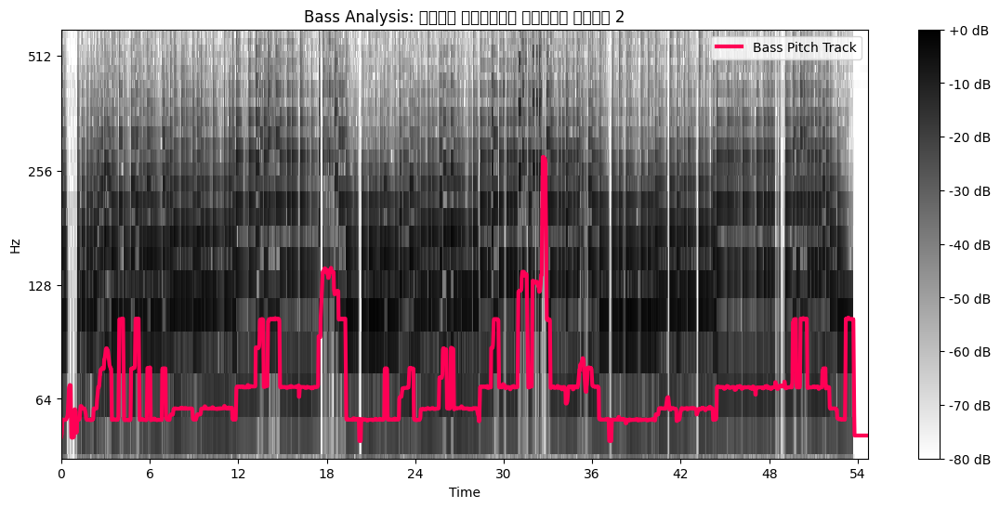

🎧 분리된 베이스 트랙 듣기:


In [11]:
# ==========================================
# 4. 베이스 트랙 로드 및 피치 트래킹
# ==========================================

# 오디오 로드
y, sr = librosa.load(bass_stem_path, sr=44100)

# [핵심] 베이스 기타에 최적화된 파라미터 튜닝
# 베이스 음역: E1(41Hz) ~ G4(392Hz) 근처
f0, voiced_flag, voiced_probs = librosa.pyin(
    y,
    fmin=40,
    fmax=400,
    sr=sr,
    hop_length=512,
    resolution=0.05,   # 정밀도 (0.1 -> 0.05)
    frame_length=4096, # 👈 저음 해상도를 위해 윈도우 크기를 2배로 늘림 (중요)
    fill_na=None
)

# [후처리] 미디언 필터로 튀는 값(Outlier) 보정
if np.any(np.isfinite(f0)):
    f0_clean = scipy.signal.medfilt(f0, kernel_size=5)
else:
    f0_clean = f0

# ==========================================
# 5. 결과 시각화 및 청취
# ==========================================
plt.figure(figsize=(14, 6))

# 배경: 스펙트로그램
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log', sr=sr, cmap='gray_r')

# 전경: 추출한 피치 (빨간 선)
times = librosa.times_like(f0, sr=sr)
plt.plot(times, f0_clean, label='Bass Pitch Track', color='#ff0055', linewidth=3)

# 그래프 설정
plt.ylim(30, 600) # 베이스 음역대에 맞춰 줌인
plt.title(f'Bass Analysis: {filename}')
plt.legend(loc='upper right')
plt.colorbar(format='%+2.0f dB')
plt.show()

# 오디오 재생
print("🎧 분리된 베이스 트랙 듣기:")
display(Audio(bass_stem_path))